<div align="center">
  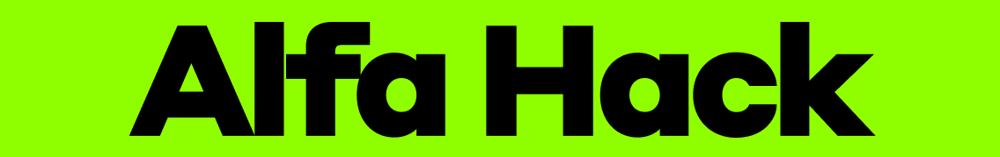
</div>

## Этап 1. Установка библиотек и импорт данных

In [1]:
# Cкачиваем необходимые библиотеки для работы
!pip install pandas numpy scikit-learn

In [64]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
import pandas as pd
import numpy as np
import glob
import os
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
from scipy.stats import pointbiserialr
from scipy.stats import shapiro

Подключаемся в Google Drive, чтобы работать с файлами из Google Colaboratory

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


Указываем путь к корневым папкам с данными test и train

__Обратите внимание:__ если вы создали папку с названием отличным от _"Хакатон Альфа-банка. Кейс 1"_, то необходимо поменять путь к директории и ссылки ниже

In [3]:
# Путь к папке с тренировочными данными
path_train = '/content/drive/MyDrive/Хакатон Альфа-банка. Кейс 1/train'
# Путь к папке с тестовыми данными
path_test = '/content/drive/MyDrive/Хакатон Альфа-банка. Кейс 1/test'

Получим список файлов в каждой из папок с данными

In [6]:
print(*[f'Список файлов в репозитории {x.split("/")[-1]}: {sorted(os.listdir(x), key=lambda x: len(x))}' for x in [path_train, path_test]], sep='\n')

Список файлов в репозитории train: ['train_2.csv', 'train_5.csv', 'train_7.csv', 'train_8.csv', 'train_4.csv', 'train_6.csv', 'train_1.csv', 'train_9.csv', 'train_3.csv', 'train_10.csv']
Список файлов в репозитории test: ['test_3.csv', 'test_6.csv', 'test_2.csv', 'test_4.csv', 'test_8.csv', 'test_7.csv', 'test_1.csv', 'test_5.csv', 'test_9.csv', 'test_10.csv']


Объединим тренировочные и тестовые данные в единые датасеты train и test

In [7]:
# Получим список путей к файлам в папке train
filenames_train = glob.glob(path_train + "/*.csv")

# Создадим список для записи считанных файлов train
data_files_train = []

# Считаем все файлы train и добавим их в список
for filename in filenames_train:
    data_files_train.append(pd.read_csv(filename))

# Объединим тренировочные данные в единый датасет
data_train = pd.concat(data_files_train, ignore_index=True)

# Выведем информацию о размерности полученных тренировочных данных
display('Размерность полных тренировочных данных составляет: {} строка и {} столбец'.format(*data_train.shape))

# Выведем первые 5 строк тренировочных данных
display(data_train.head())

# Удостоверимся, что перед нами данные только из выборки train
data_train['smpl'].value_counts(dropna=False)

'Размерность полных тренировочных данных составляет: 38731 строка и 421 столбец'

,target,smpl,id,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,...,feature_409,feature_410,feature_411,feature_412,feature_413,feature_414,feature_415,feature_416,feature_417,feature_418
0,0,train,3873,0.781053,-2.822431,1.0,-1.297398,-1.616318,-2.682773,-0.780434,...,-1.785225,-0.640910,0.0,-1.112226,-1.306706,-2.016204,-0.215154,-1.161018,-0.431538,0.886027
1,0,train,3874,-1.610554,-0.004187,1.0,-0.926986,-1.192641,-1.309490,-0.733063,...,-0.372753,-0.583215,0.0,0.931891,0.146103,-0.658290,-0.025485,0.210154,1.099961,-0.918443
2,0,train,3875,0.606618,-1.456822,0.0,0.780166,0.095048,-0.870786,-0.226350,...,0.165016,-0.449925,0.0,0.756962,-0.020179,0.518931,0.779199,0.936643,0.410800,-0.109610
3,0,train,3876,0.249014,-0.211661,0.0,0.929687,0.237440,-0.436239,-0.287175,...,0.237139,-0.339358,0.0,1.041432,-0.951589,0.595080,0.854666,1.137475,0.102690,0.182214
4,0,train,3877,0.169037,1.480832,0.0,-1.955879,-0.372808,-0.536662,-0.509941,...,0.825796,0.179982,0.0,-0.799940,-0.230657,-0.140730,0.268074,0.279254,1.317823,-0.020250


,count
smpl,
train,38731


#EDA

## Общий обзор данных

In [8]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38731 entries, 0 to 38730
Columns: 421 entries, target to feature_418
dtypes: float64(418), int64(2), object(1)
memory usage: 124.4+ MB


Выведем колонки с пропусками

In [10]:
missing_values_count = data_train.isnull().sum()
columns_with_na_count = missing_values_count[missing_values_count > 0]
print(columns_with_na_count)


Series([], dtype: int64)


Вывод: пропусков в данных не обнаружено

Проверка дубликатов

In [12]:
duplicate_rows = data_train.duplicated().sum()
duplicate_columns = data_train.T.duplicated().sum()
print(f"Количество дублирующихся колонок: {duplicate_columns}")
print(f"Количество дублирующихся строк: {duplicate_rows}")

Количество дублирующихся колонок: 0
Количество дублирующихся строк: 0


Вывод: дубликаты не обнаружены, данные являются чистыми

## Исследование типов признаков

**Гипотеза: в нашем наборе данных присутствуют не только числовые признаки**

Выведем колонки в которых < 100 уникальных элементов

In [14]:
for col in data_train.columns:
    unique_count = data_train[col].nunique()
    if unique_count < 100:
        unique_values = data_train[col].unique()
        print(f"Колонка: {col}, уникальных значений: {unique_count}")
        print(f"Уникальные значения: {unique_values}")
        print("-" * 50)

Колонка: target, уникальных значений: 2
Уникальные значения: [0 1]
--------------------------------------------------
Колонка: smpl, уникальных значений: 1
Уникальные значения: ['train']
--------------------------------------------------
Колонка: feature_3, уникальных значений: 2
Уникальные значения: [1. 0.]
--------------------------------------------------
Колонка: feature_10, уникальных значений: 3
Уникальные значения: [0. 2. 1.]
--------------------------------------------------
Колонка: feature_12, уникальных значений: 3
Уникальные значения: [0. 1. 2.]
--------------------------------------------------
Колонка: feature_14, уникальных значений: 3
Уникальные значения: [0. 2. 1.]
--------------------------------------------------
Колонка: feature_15, уникальных значений: 2
Уникальные значения: [0. 1.]
--------------------------------------------------
Колонка: feature_17, уникальных значений: 4
Уникальные значения: [4. 3. 1. 2.]
--------------------------------------------------
Коло

Сохраним названия таких колонок для дальнейшего анализа и предобработки

In [29]:
bin_features = []
cat_features = []

In [30]:
for col in data_train.columns:
    unique_count = data_train[col].nunique()
    if unique_count == 2 and col != 'target':
        bin_features.append(col)
    elif 2 < unique_count < 100:
        cat_features.append(col)

### Удаление не значимых для анализа колонок

In [17]:
data_train = data_train.drop(columns=['id', 'smpl'])

## Анализ целевого признака

In [19]:
print(data_train['target'].value_counts(normalize=True))

target
0    0.978234
1    0.021766
Name: proportion, dtype: float64


Вывод: в тренировочной выборке значительный дисбаланс классов, в пользу отрицательного

## Анализ категориальных и бинарных признаков

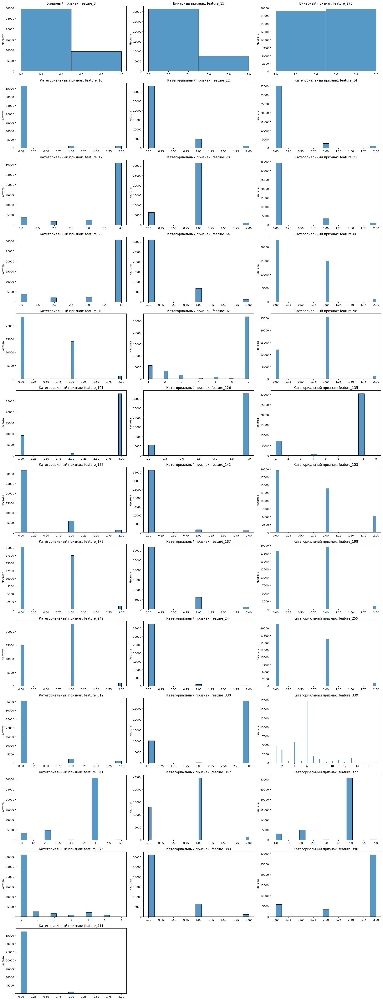

In [32]:
n_bin = len(bin_features)
n_cat = len(cat_features)
total_features = n_bin + n_cat
cols = 3
rows = (total_features // cols) + int(total_features % cols != 0)

# Создаем сетку
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 4))
axes = axes.flatten()  # Превращаем в 1D массив для удобного доступа

# Гистограммы для бинарных признаков
for i, col in enumerate(bin_features):
    sns.histplot(data_train[col], bins=2, kde=False, ax=axes[i])
    axes[i].set_title(f'Бинарный признак: {col}')
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Частота')

# Гистограммы для категориальных признаков
for j, col in enumerate(cat_features):
    sns.histplot(data_train[col], kde=False, ax=axes[n_bin + j])
    axes[n_bin + j].set_title(f'Категориальный признак: {col}')
    axes[n_bin + j].set_xlabel('')
    axes[n_bin + j].set_ylabel('Частота')

# Удаляем пустые подграфики
for k in range(total_features, len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.show()

Рассмотрим распределения количественно

Бинарные признаки

In [35]:
for col in bin_features:
    print(f"\nПризнак: {col}")
    print(data_train[col].value_counts(normalize=True))


Признак: feature_3
feature_3
0.0    0.759934
1.0    0.240066
Name: proportion, dtype: float64

Признак: feature_15
feature_15
0.0    0.804472
1.0    0.195528
Name: proportion, dtype: float64

Признак: feature_270
feature_270
2.0    0.507526
1.0    0.492474
Name: proportion, dtype: float64


Вывод: дисбаланс по колонкам 'feature_3', 'feature_15'

Категориальные признаки

In [38]:
for col in cat_features:
    # Распределение уникальных значений
    print(f"\nПризнак: {col}")
    print(data_train[col].value_counts(normalize=True).head(10))  # Вывод только 10 наиболее популярных значений

    # Проверка связи с целевой переменной через таблицу сопряженности и тест хи-квадрат
    contingency_table = pd.crosstab(data_train[col], data_train['target'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f"Хи-квадрат тест для {col}: p-значение = {p}")


Признак: feature_10
feature_10
0.0    0.939790
1.0    0.032119
2.0    0.028091
Name: proportion, dtype: float64
Хи-квадрат тест для feature_10: p-значение = 0.030921002803613467

Признак: feature_12
feature_12
0.0    0.851230
1.0    0.120679
2.0    0.028091
Name: proportion, dtype: float64
Хи-квадрат тест для feature_12: p-значение = 9.48510223618969e-06

Признак: feature_14
feature_14
0.0    0.903462
1.0    0.068446
2.0    0.028091
Name: proportion, dtype: float64
Хи-квадрат тест для feature_14: p-значение = 0.03184958786367681

Признак: feature_17
feature_17
4.0    0.793576
1.0    0.099197
3.0    0.061811
2.0    0.045416
Name: proportion, dtype: float64
Хи-квадрат тест для feature_17: p-значение = 9.212341002416741e-06

Признак: feature_20
feature_20
1.0    0.808577
0.0    0.163332
2.0    0.028091
Name: proportion, dtype: float64
Хи-квадрат тест для feature_20: p-значение = 0.008930022120597604

Признак: feature_21
feature_21
0.0    0.882575
1.0    0.089334
2.0    0.028091
Name: pro

Выведем тепловую карту корреляций бинарных и кат. признаков с 'target'

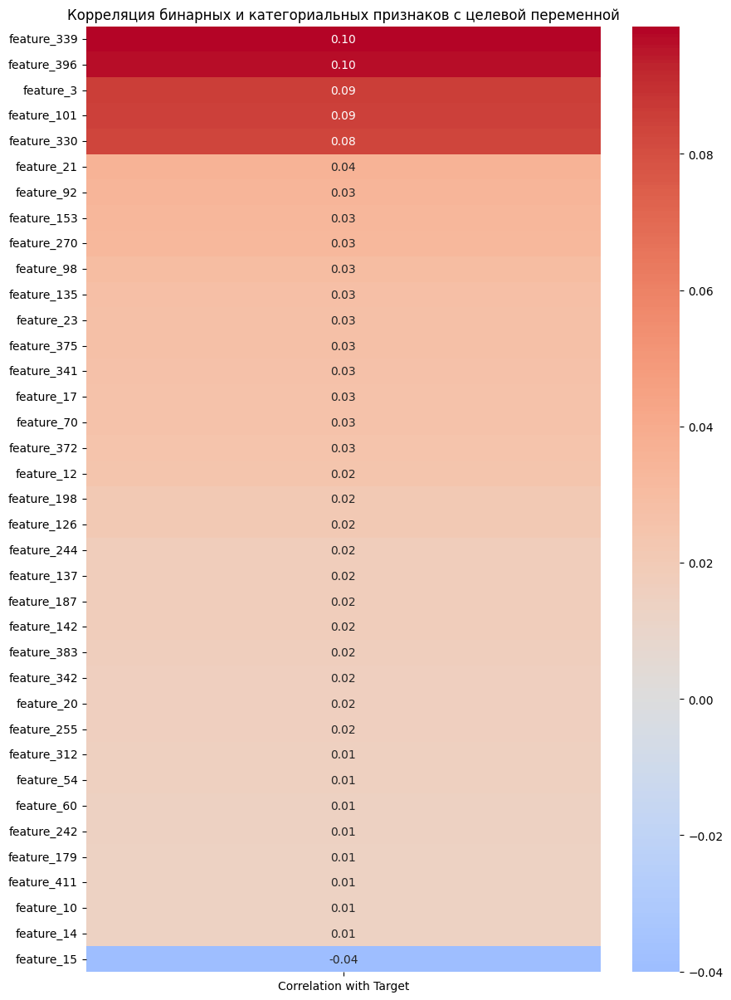

In [42]:
# Функция для вычисления Cramér’s V для категориальных признаков
def cramers_v(contingency_table):
    chi2 = chi2_contingency(contingency_table)[0]
    n = contingency_table.sum().sum()
    r, k = contingency_table.shape
    return np.sqrt(chi2 / (n * (min(r, k) - 1)))

corr_dict = {}

# 1. Вычисление корреляции бинарных признаков с `target`
for col in bin_features:
    correlation, _ = pointbiserialr(data_train[col], data_train['target'])
    corr_dict[col] = correlation

# 2. Вычисление корреляции категориальных признаков с `target`
for col in cat_features:
    contingency_table = pd.crosstab(data_train[col], data_train['target'])
    correlation = cramers_v(contingency_table)
    corr_dict[col] = correlation

corr_df = pd.DataFrame.from_dict(corr_dict, orient='index', columns=['Correlation with Target'])
corr_df = corr_df.sort_values(by='Correlation with Target', ascending=False)

# Построение тепловой карты корреляций
plt.figure(figsize=(10, len(corr_df) * 0.4))
sns.heatmap(corr_df, annot=True, cmap='coolwarm', center=0, cbar=True, fmt=".2f")
plt.title('Корреляция бинарных и категориальных признаков с целевой переменной')
plt.show()

Вывод: согласно шкале Чеддока признаки: 339, 396 - слабая корреляция. Иные признаки корреляции с 'target' не имеют.

## Анализ числовых признаков

### Выведем тепловую карту по корреляции числовых признаков с 'target' и рассмотрим подробнее наиболее влияющие признаки

Извлечем числовые признаки в отдельный список

In [43]:
num_features = [col for col in data_train.columns if col not in bin_features + cat_features + ['target']]

In [45]:
len(num_features)

381

Вывод тепловой карты

In [56]:
data_train.head()

,target,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_409,feature_410,feature_411,feature_412,feature_413,feature_414,feature_415,feature_416,feature_417,feature_418
0,0,0.781053,-2.822431,1.0,-1.297398,-1.616318,-2.682773,-0.780434,-0.449273,0.358940,...,-1.785225,-0.640910,0.0,-1.112226,-1.306706,-2.016204,-0.215154,-1.161018,-0.431538,0.886027
1,0,-1.610554,-0.004187,1.0,-0.926986,-1.192641,-1.309490,-0.733063,0.347838,-0.814975,...,-0.372753,-0.583215,0.0,0.931891,0.146103,-0.658290,-0.025485,0.210154,1.099961,-0.918443
2,0,0.606618,-1.456822,0.0,0.780166,0.095048,-0.870786,-0.226350,-1.017979,-0.714225,...,0.165016,-0.449925,0.0,0.756962,-0.020179,0.518931,0.779199,0.936643,0.410800,-0.109610
3,0,0.249014,-0.211661,0.0,0.929687,0.237440,-0.436239,-0.287175,-0.688868,0.691876,...,0.237139,-0.339358,0.0,1.041432,-0.951589,0.595080,0.854666,1.137475,0.102690,0.182214
4,0,0.169037,1.480832,0.0,-1.955879,-0.372808,-0.536662,-0.509941,2.089426,-0.624963,...,0.825796,0.179982,0.0,-0.799940,-0.230657,-0.140730,0.268074,0.279254,1.317823,-0.020250


In [55]:
data_train['target'] = data_train['target'].astype('int64')

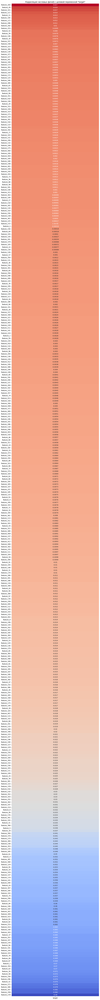

In [58]:
correlations = data_train[num_features + ['target']].corr()['target'].drop('target')
sorted_correlations = correlations.sort_values(ascending=False)

# Подбор размера окна
num_features_count = len(sorted_correlations)
fig_height = max(10, num_features_count * 0.3)

# Построение вертикальной тепловой карты
plt.figure(figsize=(10, fig_height))
sns.heatmap(sorted_correlations.to_frame(), annot=True, cmap='coolwarm', cbar=False)
plt.title('Корреляция числовых фичей с целевой переменной "target"')
plt.show()

Вывод: корреляции среди числовых признаков не обнаружено. Решение при помоши линейных моделей не будет иметь смысла

### Анализ границ числовых признаков

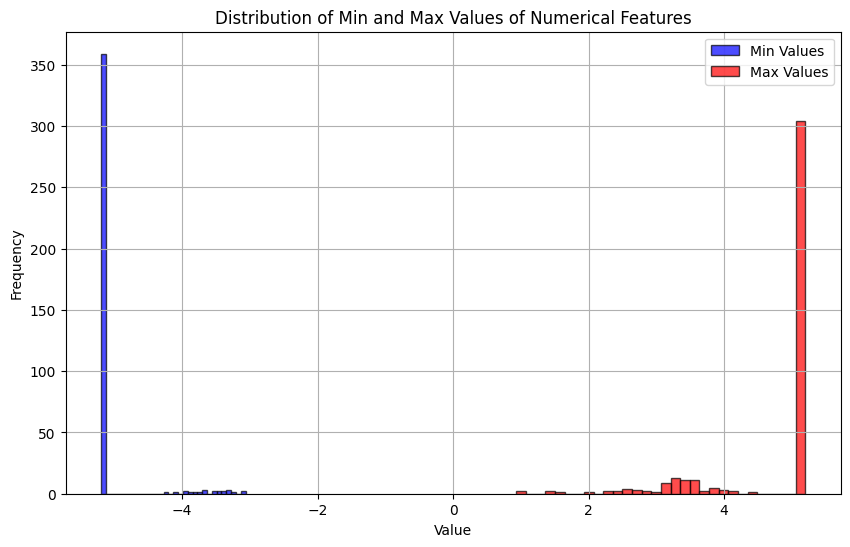

In [63]:
min_values = data_train[num_features].min()
max_values = data_train[num_features].max()

plt.figure(figsize=(10, 6))

# Гистограмма для минимальных значений
plt.hist(min_values, bins=30, alpha=0.7, color='blue', edgecolor='black', label='Min Values')

# Гистограмма для максимальных значений
plt.hist(max_values, bins=30, alpha=0.7, color='red', edgecolor='black', label='Max Values')

plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Distribution of Min and Max Values of Numerical Features')
plt.legend()
plt.grid(True)
plt.show()

Вывод: заметим, что границы всех числовых признаков ограниченны (-5, 5)

### Распределения числовых признаков

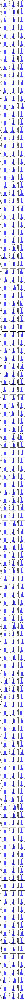

In [60]:
num_features_count = len(num_features)

num_cols = 3
num_rows = (num_features_count + num_cols - 1) // num_cols  # Округление вверх

fig_height = max(10, num_rows * 3)
fig_width = max(10, num_cols * 3)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(fig_width, fig_height))

# Построение гистограмм
for i, feature in enumerate(num_features):
    row = i // num_cols
    col = i % num_cols
    axes[row, col].hist(data_train[feature], bins=30, alpha=0.7, color='blue', edgecolor='black')
    axes[row, col].set_title(feature)
    axes[row, col].set_xlabel('Value')
    axes[row, col].set_ylabel('Frequency')

# Удаление пустых subplot
for i in range(num_features_count, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

### Проверим распределения числовых признаков на "нормальность"

Shapiro-Wilk test

In [66]:
# Уровень значимости
alpha = 0.05

normal_features = []
non_normal_features = []

for feature in num_features:
    data = data_train[feature].dropna()
    stat, p = shapiro(data)
    if p < alpha:
        non_normal_features.append(feature)
    else:
        normal_features.append(feature)

print("Колонки с нормальным распределением:", normal_features)
print("Колонки с ненормальным распределением:", non_normal_features)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 38731.
  res = hypotest_fun_out(*samples, **kwds)


Колонки с нормальным распределением: []
Колонки с ненормальным распределением: ['feature_1', 'feature_2', 'feature_4', 'feature_5', 'feature_6', 'feature_7', 'feature_8', 'feature_9', 'feature_11', 'feature_13', 'feature_16', 'feature_18', 'feature_19', 'feature_22', 'feature_24', 'feature_25', 'feature_26', 'feature_27', 'feature_28', 'feature_29', 'feature_30', 'feature_31', 'feature_32', 'feature_33', 'feature_34', 'feature_35', 'feature_36', 'feature_37', 'feature_38', 'feature_39', 'feature_40', 'feature_41', 'feature_42', 'feature_43', 'feature_44', 'feature_45', 'feature_46', 'feature_47', 'feature_48', 'feature_49', 'feature_50', 'feature_51', 'feature_52', 'feature_53', 'feature_55', 'feature_56', 'feature_57', 'feature_58', 'feature_59', 'feature_61', 'feature_62', 'feature_63', 'feature_64', 'feature_65', 'feature_66', 'feature_67', 'feature_68', 'feature_69', 'feature_71', 'feature_72', 'feature_73', 'feature_74', 'feature_75', 'feature_76', 'feature_77', 'feature_78', 'fea

Вывод: заметим, что распределение каждого числового признака не является нормальным. Это необходимо будет учитывать при предобработке

### Анализ выбросов

Используем нативный метод IQR для классификации выбросов. Результаты визуализируем

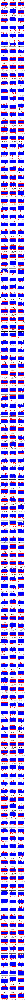

In [67]:
num_cols = 3
num_rows = (num_features_count + num_cols - 1) // num_cols

# Подбор размера окна
fig_height = max(10, num_rows * 3)
fig_width = max(10, num_cols * 3)

# Создание subplot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(fig_width, fig_height))

# Функция для определения выбросов с использованием IQR
def detect_outliers(data):
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = (data < lower_bound) | (data > upper_bound)
    return outliers

# Построение scatter plot для каждого числового признака с отмеченными выбросами
for i, feature in enumerate(num_features):
    row = i // num_cols
    col = i % num_cols
    data = data_train[feature].dropna()  # Удаление пропущенных значений
    outliers = detect_outliers(data)
    axes[row, col].scatter(data.index, data, color='blue', label='Data')
    axes[row, col].scatter(data[outliers].index, data[outliers], color='red', label='Outliers')
    axes[row, col].set_title(feature)
    axes[row, col].legend()

# Удаление пустых subplot
for i in range(num_features_count, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

Вывод: в данных присутствуют явные выбросы, необходимо учесть это на этапе предобработки.